In [1]:
import numpy as np
import matplotlib
import astropy.io.fits as afits
from astropy.wcs import WCS
import reproject
from astropy.visualization import ZScaleInterval
import astropy.table as at
import astropy.coordinates as coords
import astropy.units as u
from astropy.visualization.wcsaxes import WCSAxes
import astropy.visualization.wcsaxes.frame as frame
import matplotlib.patheffects
import regions
from regions import PixCoord
from regions import RectangleSkyRegion, RectanglePixelRegion
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable

from matplotlib.legend_handler import HandlerBase

#from matplotlib import rc
#rc('text', usetex=True)
#rc('axes', unicode_minus=True)
#rc('font',**{'family':'serif','serif':['Times New Roman']})

%matplotlib notebook
%pylab

Using matplotlib backend: nbAgg
Populating the interactive namespace from numpy and matplotlib


In [2]:
mwmap = afits.open('mwpan2_RGB_3600.fits')
sourceheader = mwmap[0].header
sourcewcs = WCS(sourceheader).celestial
data = mwmap[0].data

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [3]:
targetheader = mwmap[0].header
#targetheader['CTYPE1']='GLON-AIT'
#targetheader['CTYPE2']='GLAT-AIT'
targetheader['CTYPE1']='RA---AIT'
targetheader['CTYPE2']='DEC--AIT'
targetheader['CRVAL1'] = 120.
targetheader['CRVAL2'] = 0.
targetwcs = WCS(targetheader).celestial

the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [4]:
print(sourcewcs)
print(targetwcs)

WCS Keywords

Number of WCS axes: 2
CTYPE : 'GLON-CAR'  'GLAT-CAR'  
CRVAL : 0.0  0.0  
CRPIX : 1800.950026799  900.950013387949  
CD1_1 CD1_2  : -0.099999998509884  0.0  
CD2_1 CD2_2  : 0.0  0.099999998509884  
NAXIS : 3600  1800
WCS Keywords

Number of WCS axes: 2
CTYPE : 'RA---AIT'  'DEC--AIT'  
CRVAL : 120.0  0.0  
CRPIX : 1800.950026799  900.950013387949  
CD1_1 CD1_2  : -0.099999998509884  0.0  
CD2_1 CD2_2  : 0.0  0.099999998509884  
NAXIS : 3600  1800


In [5]:
b, footprint = reproject.reproject_interp((data[0], sourcewcs), targetwcs, (1800, 3600), order='nearest-neighbor')
g, footprint = reproject.reproject_interp((data[1], sourcewcs), targetwcs, (1800, 3600), order='nearest-neighbor')
r, footprint = reproject.reproject_interp((data[2], sourcewcs), targetwcs, (1800, 3600), order='nearest-neighbor')

In [6]:
zscaler = ZScaleInterval(nsamples=100000, contrast=0.175)
b1 = zscaler(b)
g1 = zscaler(g)
r1 = zscaler(r)
alphamask = np.isnan(b1)

In [7]:
z1 = np.array((r1, g1, b1,~alphamask))
z2 = np.moveaxis(z1, 0, -1)
z2.shape

(1800, 3600, 4)

In [8]:
pos = at.Table.read('yse_dr1_sn-like_w_spec_class.csv',format='ascii.csv')
pos_coords = [coords.SkyCoord("{} {}".format(x, y), unit=(u.deg, u.deg)) for x, y in zip(pos['RA'], pos['DEC'])]
plot_coords = [(x.ra.degree, x.dec.degree) for x in pos_coords]

def col(x):

    x = str(x)
    if x.startswith('SNIa'):
        return 'C0'
    elif x.startswith('SNII'):
        return 'C1'
    elif x.startswith('SNIb'):
        return 'C2'
    elif x.startswith('NA'):
        return 'yellow'
    else:
        return 'C3'
    
colors = [col(x) for x in pos['SPEC_CLASS']]

ra, dec = zip(*plot_coords)
ra = np.array(ra)
dec = np.array(dec)

In [9]:
pos

SNID,RA,DEC,SPEC_CLASS_BROAD,SPEC_CLASS,Z
str8,float64,float64,str5,str14,float64
2019lbi,190.088004,1.273998,SNII,SNII,0.013
2019pmd,49.599161,-1.930453,SNIa,SNIa-norm,0.022
2019ppi,133.897475,49.160259,SNII,SNII,0.052
2019szh,147.176208,-8.734392,SNIa,SNIa-norm,0.0478
2019tvv,177.772596,21.767258,SNIa,SNIa-norm,0.026
2019ucc,49.642135,-4.429429,NA,NA,0.066
2019uev,142.706471,30.871843,NA,NA,0.0591
...,...,...,...,...,...
2021zqv,335.188258,7.04055,NA,NA,0.139


In [10]:
exptime_fields = at.Table.read('yse_exptime_untilDec2021.txt', format='ascii', names=['field','exptime'])
field_centers  = at.Table.read('yse_fields.csv', format='csv', names=['field','ra','dec'])
special_sne = ['2021pfs', '2021hpr', '2021J','2020uxz','2020jgl']

rects = {}
for f in exptime_fields:
    field = f['field']
    exptime = f['exptime']
    ind = (field_centers['field'] == field)
    center_sky = coords.SkyCoord(field_centers['ra'][ind][0], field_centers['dec'][ind][0], unit='deg', frame='fk5')
    region_sky = RectangleSkyRegion(center=center_sky,width=3*u.deg, height= 3*u.deg)
    rects[field] = region_sky, exptime
for sn in special_sne:
    ind = np.where(pos['SNID'] == sn)[0][0]
    center_sky = pos_coords[ind]
    print(sn, center_sky)
    region_sky = RectangleSkyRegion(center=center_sky,width=3*u.deg, height= 3*u.deg)
    rects['SN'+sn] = region_sky, 0.

max_expt = exptime_fields['exptime'].max()

2021pfs <SkyCoord (ICRS): (ra, dec) in deg
    (210.848253, -6.031638)>
2021hpr <SkyCoord (ICRS): (ra, dec) in deg
    (154.160875, 73.400497)>
2021J <SkyCoord (ICRS): (ra, dec) in deg
    (186.61257, 31.222369)>
2020uxz <SkyCoord (ICRS): (ra, dec) in deg
    (21.028705, 12.921477)>
2020jgl <SkyCoord (ICRS): (ra, dec) in deg
    (142.243417, -14.805574)>


<IPython.core.display.Javascript object>


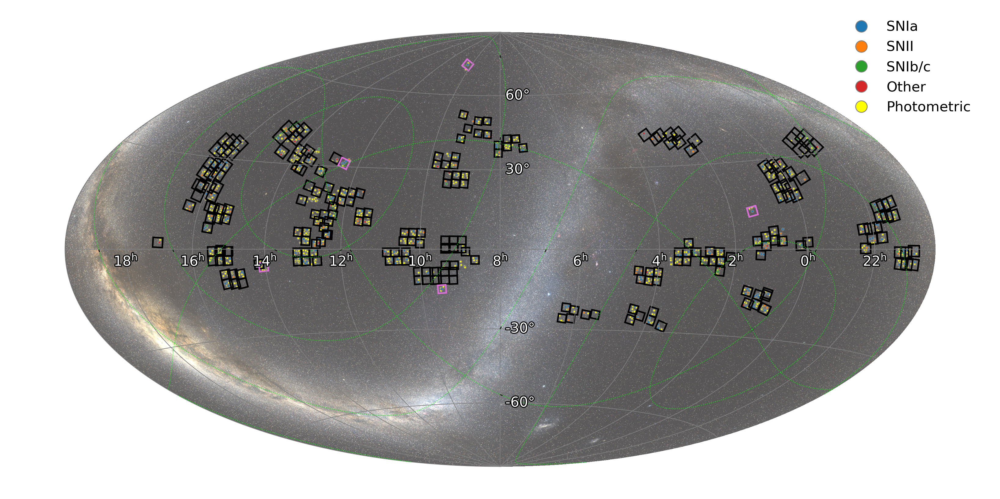

In [16]:
fig = plt.figure(figsize=(18,9))
ax3 = fig.add_subplot(111, projection=targetwcs, frame_class=frame.EllipticalFrame)

#divider = make_axes_locatable(ax3)
#cax = divider.append_axes('bottom', size='1%', pad=0.05)

#suptitle = f'{len(pos)} YSE Transients as of 2/1/2022'
im = ax3.imshow(z2, origin='lower', alpha=0.7)

path_effects=[matplotlib.patheffects.withStroke(linewidth=2.5, foreground='black')]

ax3.coords.grid(color='grey', ls='solid')
#ax3.coords['glat'].set_ticks(spacing=30 * u.degree, color='grey', exclude_overlapping=True)
#ax3.coords['glon'].set_ticks(spacing=30 * u.degree, color='grey', exclude_overlapping=True)
#ax3.coords['glon'].set_ticklabel(color='lime', path_effects=path_effects, fontsize=28)
#ax3.coords['glat'].set_ticklabel_position('v')
#ax3.coords['glat'].set_ticklabel(color='lime', path_effects=path_effects, fontsize=28)

ax3.coords['ra'].set_ticks(spacing=30 * u.degree, color='grey', exclude_overlapping=True)
ax3.coords['dec'].set_ticks(spacing=30 * u.degree, color='grey', exclude_overlapping=True)

ax3.coords['ra'].set_major_formatter('hh')

ax3.coords['ra'].set_ticklabel(color='white', path_effects=path_effects, fontsize=18)
ax3.coords['dec'].set_ticklabel_position('v')
ax3.coords['dec'].set_ticklabel(color='white', path_effects=path_effects, fontsize=18)

#overlay = ax3.get_coords_overlay('fk5')
#overlay.grid(color='yellow', ls='dotted',lw=3, alpha=0.6)

overlay = ax3.get_coords_overlay('galactic')
overlay.grid(color='lime', ls='dotted',lw=1, alpha=0.8)

colm = np.array(colors)
mask = colm == 'yellow'

ax3.scatter(ra[mask], dec[mask], marker='o',facecolor=colm[mask], transform=ax3.get_transform('fk5'),\
         linestyle='None', edgecolor='grey', s=10)

ax3.scatter(ra[~mask], dec[~mask], marker='o',facecolor=colm[~mask], transform=ax3.get_transform('fk5'),\
         linestyle='None', edgecolor='grey', s=10)
im.set_clip_path(ax3.coords.frame.patch)


for field, region_expt in rects.items():
    region, exptime = region_expt
    pixel_region = region.to_pixel(targetwcs)
    #pixel_region.plot(ax=ax3, edgecolor='grey', facecolor='grey',\
    #                  fill=True, alpha=exptime/max_expt, lw=0.25)
    if field.startswith('SN'):
        pixel_region.plot(ax=ax3, edgecolor='orchid',\
                      fill=False, lw=2)
    else:
        pixel_region.plot(ax=ax3, edgecolor='k',\
                      fill=False, lw=2)
   
#cmap = mpl.cm.Greys
#norm = mpl.colors.Normalize(vmin=0, vmax=max_expt)
#sm = mpl.cm.ScalarMappable(cmap=cmap, norm=norm)
#fig.colorbar(sm, cax=cax, orientation='horizontal', shrink=0.75)

fig.tight_layout()
ax3.coords.frame.set_color('white')
#savefig('allsky.pdf')
#fig.suptitle(suptitle, fontsize=32)

list_color  = ["C0", "C1", "C2", "C3", "yellow"]
list_mak    = ["o","o","o", "o", "o"]
list_lab    = ['SNIa','SNII','SNIb/c','Other', 'Photometric']

class MarkerHandler(HandlerBase):
    def create_artists(self, legend, tup,xdescent, ydescent,
                        width, height, fontsize,trans):
        return [plt.Line2D([width/2], [height/2.],ls="", markeredgecolor='grey', ms=15,
                       marker=tup[1],color=tup[0], transform=trans)]
    
ax3.legend(list(zip(list_color,list_mak)), list_lab, 
          handler_map={tuple:MarkerHandler()}, fontsize=18, prop={'size': 18}, frameon=False) 

fig.show()

In [17]:


    
savefig('yse_sne_dr1_allsky_equatorial_20230126_wCepheidSN.png')
    
savefig('yse_sne_dr1_allsky_equatorial_20230126_wCepheidSN.pdf')

<IPython.core.display.Javascript object>


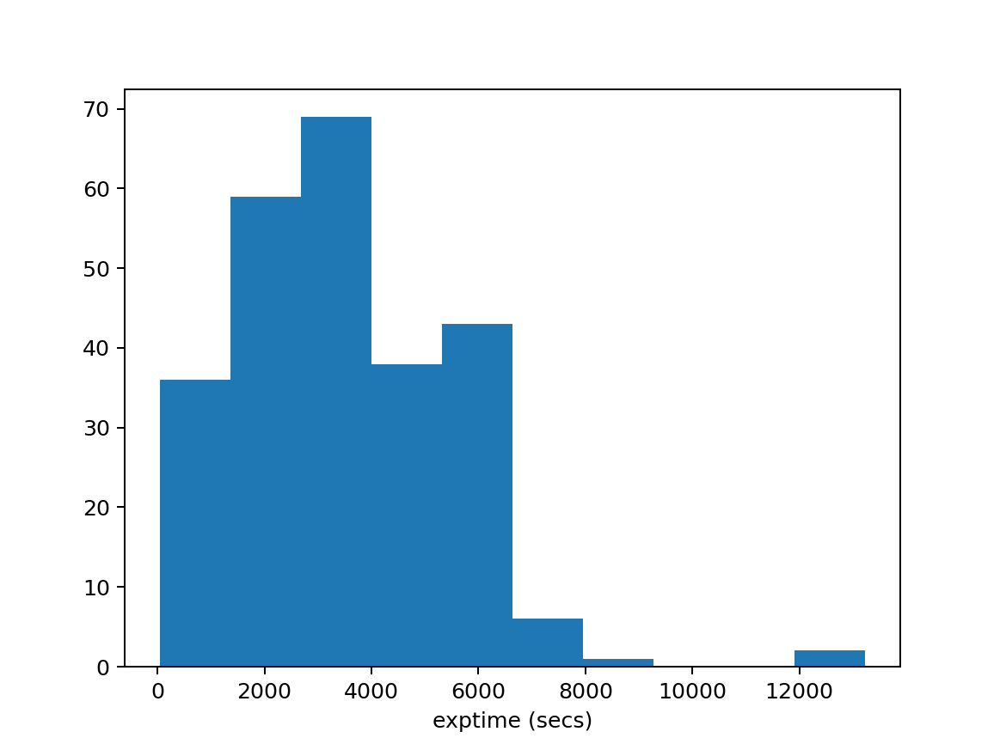

In [13]:
fig2 = plt.figure()
ax2 = fig2.add_subplot()
ax2.hist(exptime_fields['exptime'])
ax2.set_xlabel('exptime (secs)')
fig2.savefig('exptime.png')